In [1]:
%load_ext autoreload
%autoreload 2

In [3]:
import sys
sys.path.append(r"/n/home12/binxuwang/Github/Closed-loop-visual-insilico")
sys.path.append(r"/Users/binxuwang/Github/Closed-loop-visual-insilico/")
from os.path import join
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from core.data_utils import load_neural_data, load_from_hdf5, load_neural_trial_resp_tensor, create_response_tensor
from core.posthoc_prediction_utils import parse_accentuated_filenames_to_df

In [28]:
tabdir  = "/Users/binxuwang/Github/Closed-loop-visual-insilico/tables"
subject_id = "red_20250504-20250512"
df_accentuated = pd.read_pickle(join(tabdir, f"{subject_id}_202505_accentuated_df.pkl"))
df_accentuated["score"] = df_accentuated["score"].astype(float)
df_accentuated["neural_activation"] = df_accentuated["neural_activation"].astype(float)

In [ ]:
for model_name in df_accentuated.model_name.unique():
    unit_ids = df_accentuated.unit_id.unique()  # Based on the context showing these unit IDs
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    for i, unit_id in enumerate(unit_ids):
        model_unit_df = df_accentuated.query("model_name == @model_name and unit_id == @unit_id")
        sns.scatterplot(data=model_unit_df, 
                        x="score", y="neural_activation", hue="img_id", 
                        palette="Set2", ax=axes[i])
        
        corr_per_img = []
        for img_id in model_unit_df["img_id"].unique():
            subset = model_unit_df.query("img_id == @img_id")
            corr_per_img.append(subset["score"].corr(subset["neural_activation"]))
            # sns.regplot(data=subset, x="score", y="neural_activation", 
            #             scatter=False, ax=axes[i])
        
        # Calculate correlation coefficient for this unit
        corr_r = model_unit_df["score"].corr(model_unit_df["neural_activation"])
        corr_r_per_img_mean = np.mean(corr_per_img)
        axes[i].text(0.05, 0.95, f'r = {corr_r:.3f}\nmean r per img = {corr_r_per_img_mean:.3f}', 
                    transform=axes[i].transAxes, 
                    verticalalignment='top',
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        axes[i].set_title(f"Unit {unit_id}")
        axes[i].set_aspect(1.0)
        # Add diagonal line
        lims = [
            np.min([axes[i].get_xlim(), axes[i].get_ylim()]),  # min of both axes
            np.max([axes[i].get_xlim(), axes[i].get_ylim()]),  # max of both axes
        ]
        axes[i].plot(lims, lims, 'k--', alpha=0.5, zorder=0)
        axes[i].legend().remove()  # Remove individual legends to avoid clutter
    plt.suptitle(f"{subject_id} | {model_name}")
    plt.tight_layout()
    plt.show()

In [8]:
[*df_accentuated.model_name.unique()]

['AlexNet_training_seed_01',
 'clipag_vitb32',
 'dinov2_vitb14_reg',
 'radio_v2.5-b',
 'regnety_640',
 'resnet50',
 'resnet50_clip',
 'resnet50_dino',
 'resnet50_robust',
 'siglip2_vitb16']

In [9]:
output_modelnames = ['AlexNet_training_seed_01',
 'resnet50_robust',
 'resnet50_clip',
 'resnet50_dino',
 'resnet50',
 'regnety_640',
 'dinov2_vitb14_reg',
 'clipag_vitb32',
 'siglip2_vitb16',
 'radio_v2.5-b',]

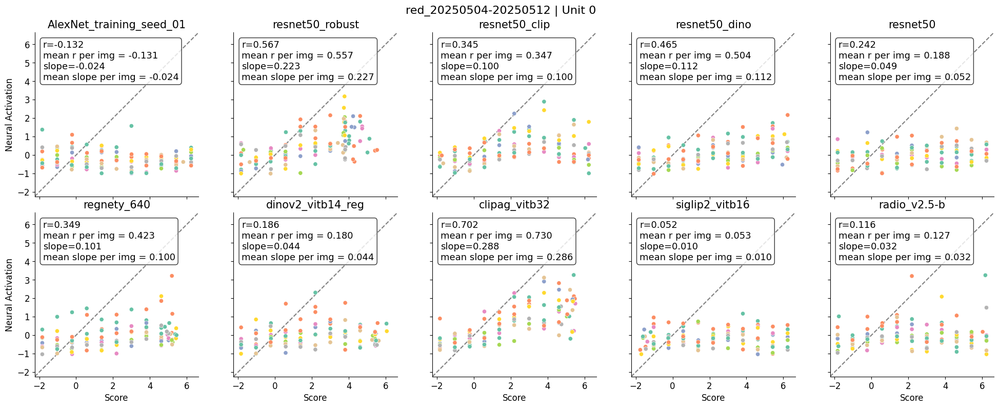

In [29]:
fig, axes = plt.subplots(2, 5, figsize=(20, 8), sharex=True, sharey=True)
axes = axes.flatten()
unit_id = 0

# unit_ids = df_accentuated.unit_id.unique()  # Based on the context showing these unit IDs
for i, model_name in enumerate(output_modelnames):
    # for i, unit_id in enumerate(unit_ids):
    model_unit_df = df_accentuated.query("model_name == @model_name and unit_id == @unit_id")
    sns.scatterplot(data=model_unit_df, 
                    x="score", y="neural_activation", hue="img_id", 
                    palette="Set2", ax=axes[i])
    
    corr_per_img = []
    slope_per_img = []
    for img_id in model_unit_df["img_id"].unique():
        model_unit_per_img_df = model_unit_df.query("img_id == @img_id")
        corr_per_img.append(model_unit_per_img_df["score"].corr(model_unit_per_img_df["neural_activation"]))
        fit_per_img = np.polyfit(model_unit_per_img_df["score"], model_unit_per_img_df["neural_activation"], 1)
        slope_per_img.append(fit_per_img[0])
        # sns.regplot(data=subset, x="score", y="neural_activation", 
        #             scatter=False, ax=axes[i])
    
    # Calculate correlation coefficient for this unit
    corr_r = model_unit_df["score"].corr(model_unit_df["neural_activation"])
    fit_all = np.polyfit(model_unit_df["score"], model_unit_df["neural_activation"], 1)
    slope_all = fit_all[0]
    corr_r_per_img_mean = np.mean(corr_per_img)
    slope_per_img_mean = np.mean(slope_per_img)
    
    axes[i].text(0.05, 0.95, f'r={corr_r:.3f}\nmean r per img = {corr_r_per_img_mean:.3f}\nslope={slope_all:.3f}\nmean slope per img = {slope_per_img_mean:.3f}', 
                transform=axes[i].transAxes, 
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),
                fontsize=13)
    axes[i].set_title(f"{model_name}", fontsize=15)
    # axes[i].set_xlabel("Score", fontsize=12)
    axes[i].set_ylabel("Neural Activation", fontsize=12)
    axes[i].set_xlabel("Score", fontsize=12)
    axes[i].tick_params(axis='both', which='major', labelsize=12)
    axes[i].set_aspect(1.0)
    axes[i].axline((0, 0), slope=1, color='k', linestyle='--', alpha=0.5, zorder=0)
    axes[i].legend().remove()  # Remove individual legends to avoid clutter

for ax in axes:
    lims = [
        np.min([axes[i].get_xlim(), axes[i].get_ylim()]),  # min of both axes
        np.max([axes[i].get_xlim(), axes[i].get_ylim()]),  # max of both axes
    ]
    ax.set_xlim(lims)
    ax.set_ylim(lims)

plt.suptitle(f"{subject_id} | Unit {unit_id}", fontsize=16)
plt.tight_layout()
plt.show()

### Large scale figure export

In [68]:
from circuit_toolkit.plot_utils import saveallforms
syndir = "/Users/binxuwang/Github/Closed-loop-visual-insilico/export_dir/control_score_synopsis"

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/var/folders/zc/krgdt7x11zvc_h0tv7k3mfdh0000gq/T/ipykernel_61884/4174171628.py:49: RankWarning: Polyfit may be poorly conditioned
  fit_per_img = np.polyfit(model_unit_per_img_df["score"], model_unit_per_img_df["neural_activation"], 1)


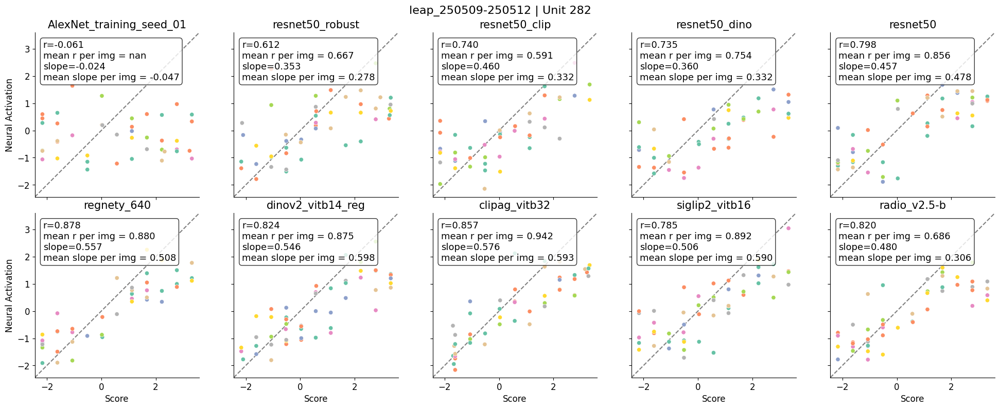

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/var/folders/zc/krgdt7x11zvc_h0tv7k3mfdh0000gq/T/ipykernel_61884/4174171628.py:49: RankWarning: Polyfit may be poorly conditioned
  fit_per_img = np.polyfit(model_unit_per_img_df["score"], model_unit_per_img_df["neural_activation"], 1)


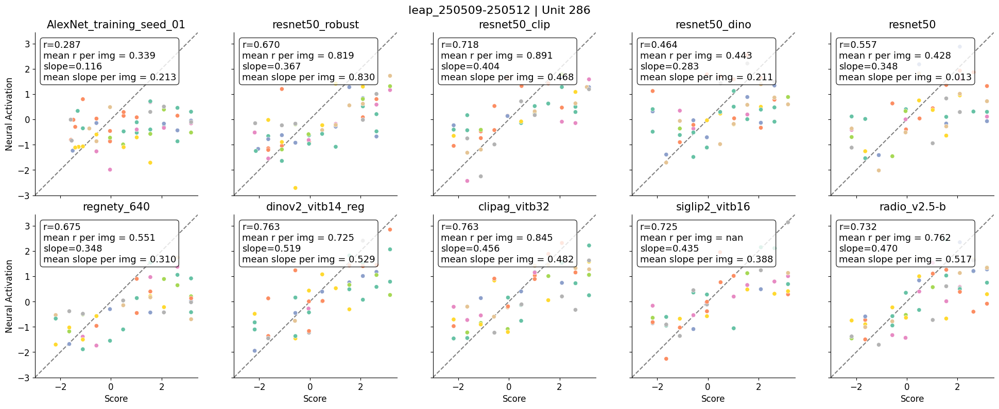

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/var/folders/zc/krgdt7x11zvc_h0tv7k3mfdh0000gq/T/ipykernel_61884/4174171628.py:49: RankWarning: Polyfit may be poorly conditioned
  fit_per_img = np.polyfit(model_unit_per_img_df["score"], model_unit_per_img_df["neural_activation"], 1)
/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/Users/binxuwang/

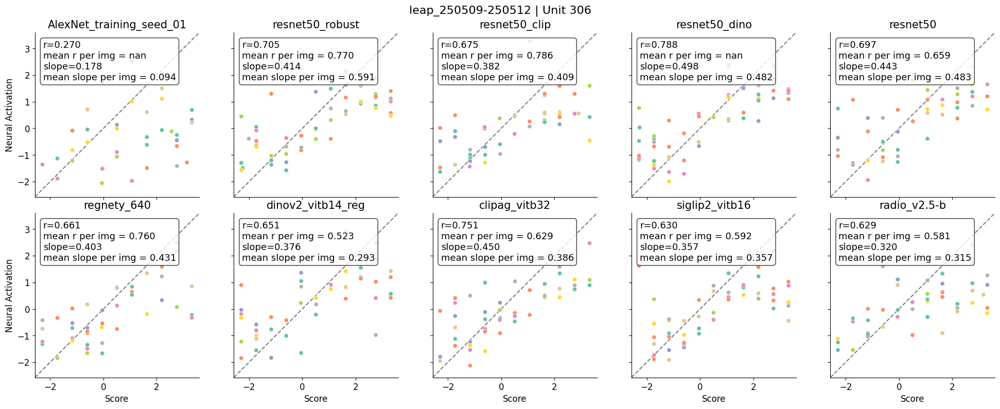

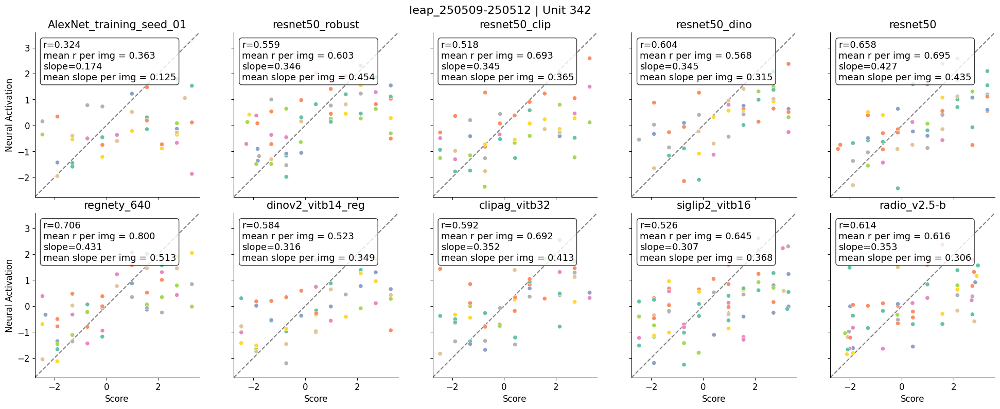

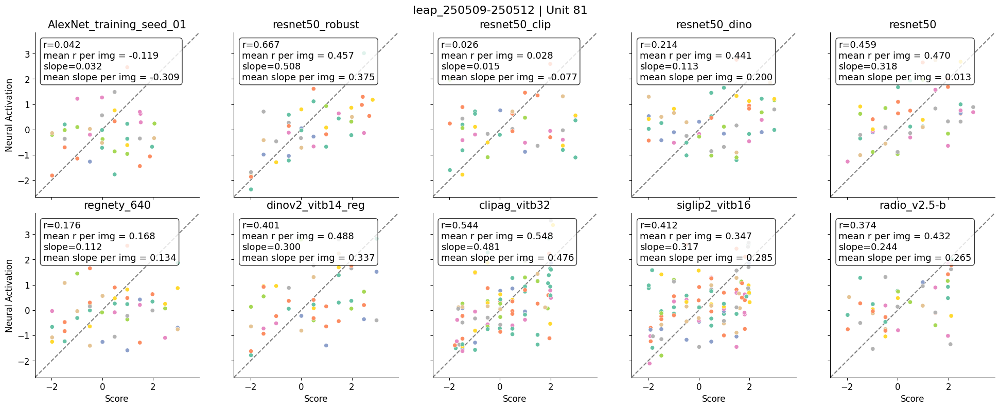

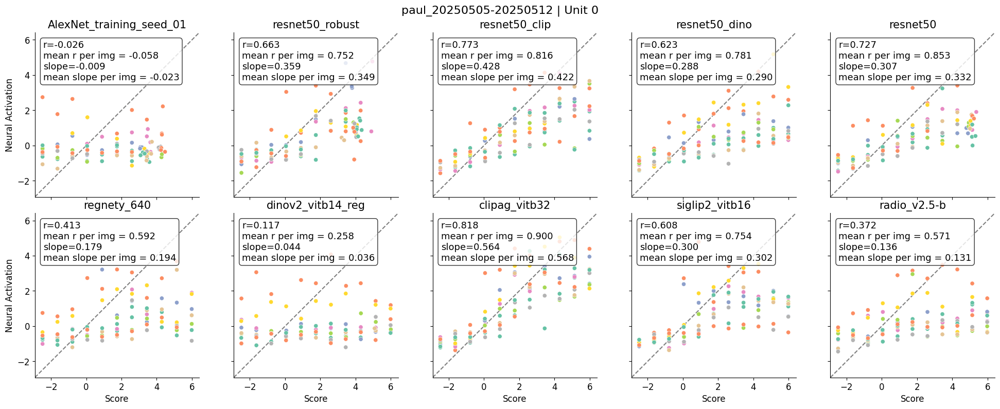

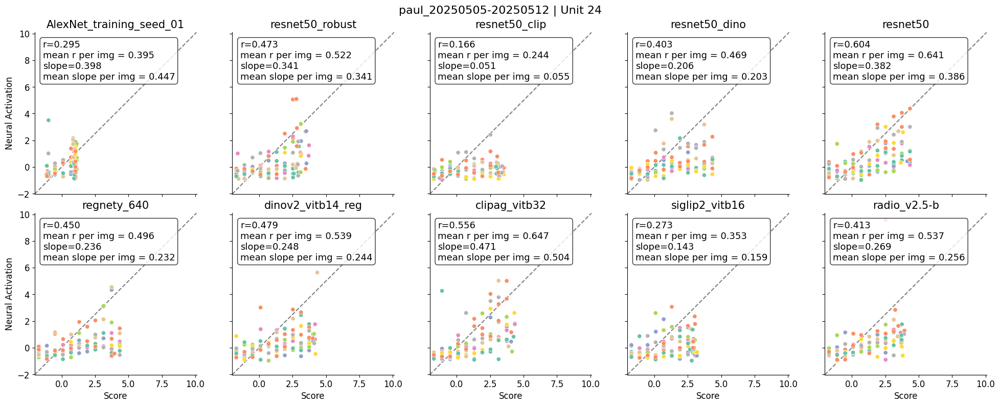

...

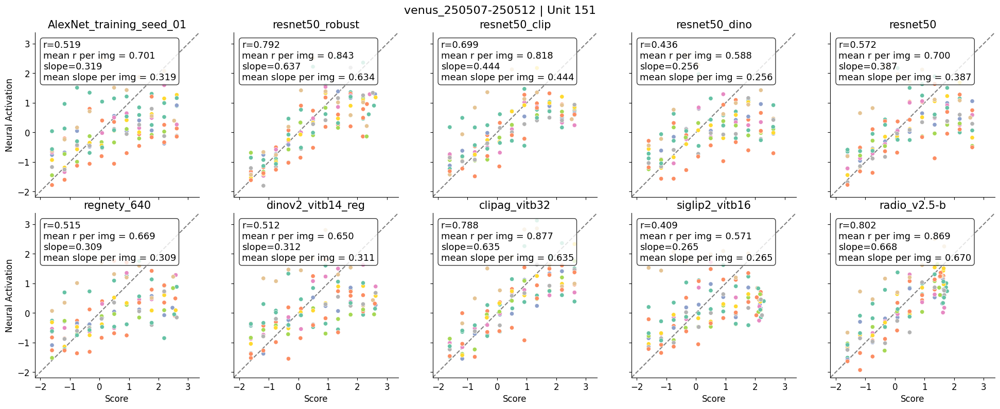

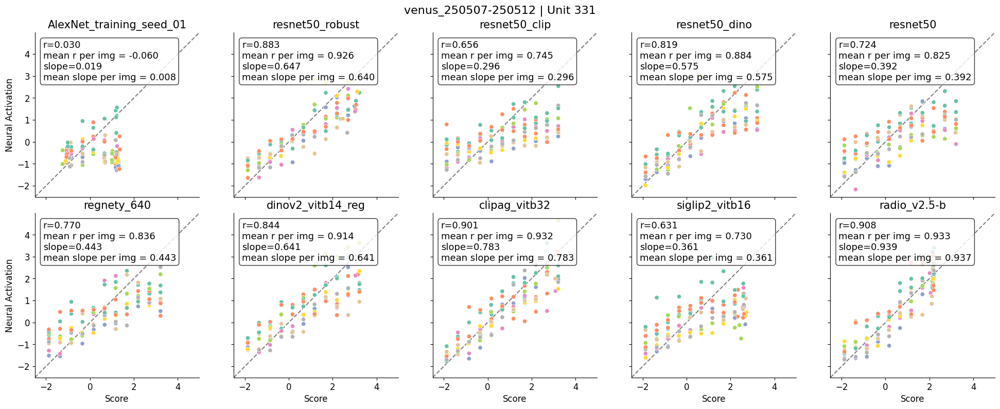

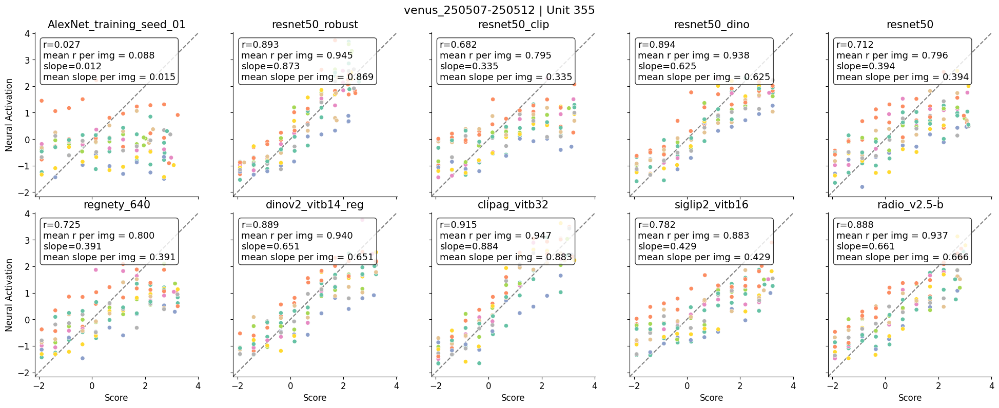

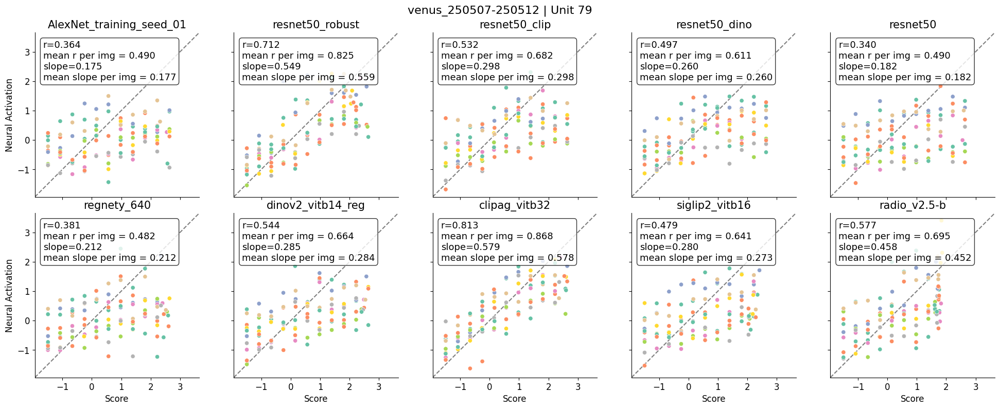

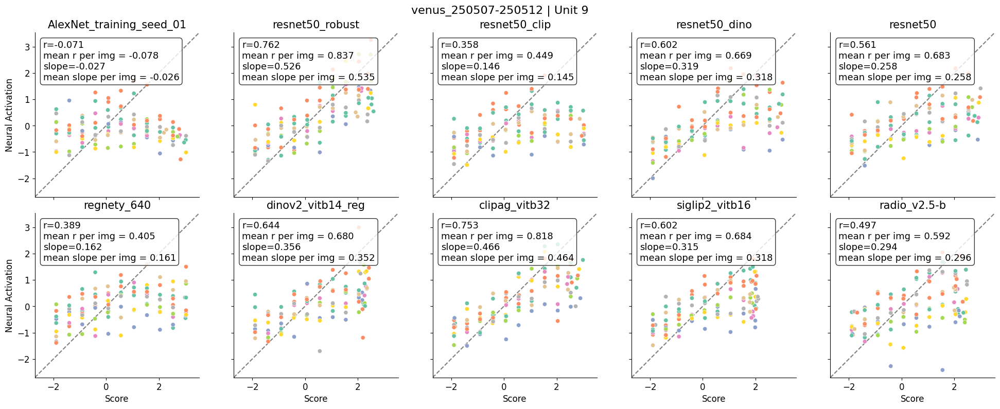

In [70]:
for subject_id in ['leap_250509-250512', 
                   'paul_20250505-20250512', 
                   'red_20250504-20250512', 
                   'three0_250508-250512', 
                   'venus_250507-250512']:
    df_accentuated = pd.read_pickle(join(tabdir, f"{subject_id}_202505_accentuated_df.pkl"))
    df_accentuated["score"] = df_accentuated["score"].astype(float)
    df_accentuated["neural_activation"] = df_accentuated["neural_activation"].astype(float)
    unit_ids = df_accentuated.unit_id.unique()  # Based on the context showing these unit IDs
    for unit_id in unit_ids:
        fig, axes = plt.subplots(2, 5, figsize=(20, 8), sharex=True, sharey=True)
        axes = axes.flatten()

        # unit_ids = df_accentuated.unit_id.unique()  # Based on the context showing these unit IDs
        for i, model_name in enumerate(output_modelnames):
            # for i, unit_id in enumerate(unit_ids):
            model_unit_df = df_accentuated.query("model_name == @model_name and unit_id == @unit_id")
            sns.scatterplot(data=model_unit_df, 
                            x="score", y="neural_activation", hue="img_id", 
                            palette="Set2", ax=axes[i])
            axes[i].set_title(f"{model_name}", fontsize=15)
            # axes[i].set_xlabel("Score", fontsize=12)
            axes[i].set_ylabel("Neural Activation", fontsize=12)
            axes[i].set_xlabel("Score", fontsize=12)
            axes[i].tick_params(axis='both', which='major', labelsize=12)
            axes[i].set_aspect(1.0)
            axes[i].axline((0, 0), slope=1, color='k', linestyle='--', alpha=0.5, zorder=0)
            axes[i].legend().remove()  # Remove individual legends to avoid clutter

        for ax in axes:
            lims = [
                np.min([axes[i].get_xlim(), axes[i].get_ylim()]),  # min of both axes
                np.max([axes[i].get_xlim(), axes[i].get_ylim()]),  # max of both axes
            ]
            ax.set_xlim(lims)
            ax.set_ylim(lims)

        plt.suptitle(f"{subject_id} | Unit {unit_id}", fontsize=16)
        plt.tight_layout()
        saveallforms(syndir, f"{subject_id}_Unit{unit_id}_10_model_control_cmp")

        for i, model_name in enumerate(output_modelnames):
            model_unit_df = df_accentuated.query("model_name == @model_name and unit_id == @unit_id")
            corr_per_img = []
            slope_per_img = []
            for img_id in model_unit_df["img_id"].unique():
                model_unit_per_img_df = model_unit_df.query("img_id == @img_id")
                corr_per_img.append(model_unit_per_img_df["score"].corr(model_unit_per_img_df["neural_activation"]))
                fit_per_img = np.polyfit(model_unit_per_img_df["score"], model_unit_per_img_df["neural_activation"], 1)
                slope_per_img.append(fit_per_img[0])
                # sns.regplot(data=subset, x="score", y="neural_activation", 
                #             scatter=False, ax=axes[i])
            
            # Calculate correlation coefficient for this unit
            corr_r = model_unit_df["score"].corr(model_unit_df["neural_activation"])
            fit_all = np.polyfit(model_unit_df["score"], model_unit_df["neural_activation"], 1)
            slope_all = fit_all[0]
            corr_r_per_img_mean = np.mean(corr_per_img)
            slope_per_img_mean = np.mean(slope_per_img)
            
            axes[i].text(0.05, 0.95, f'r={corr_r:.3f}\nmean r per img = {corr_r_per_img_mean:.3f}\nslope={slope_all:.3f}\nmean slope per img = {slope_per_img_mean:.3f}', 
                        transform=axes[i].transAxes, 
                        verticalalignment='top',
                        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),
                        fontsize=13)
            
        saveallforms(syndir, f"{subject_id}_Unit{unit_id}_10_model_control_cmp_w_stats")
        plt.show()

### Export target comparison 

In [99]:
df_accentuated[["score", "neural_activation"]].dtypes

score                float64
neural_activation    float64
dtype: object

In [102]:
subject_id = 'red_20250504-20250512'

df_accentuated = pd.read_pickle(join(tabdir, f"{subject_id}_202505_accentuated_df.pkl"))
df_accentuated["score"] = df_accentuated["score"].astype(float)
df_accentuated["neural_activation"] = df_accentuated["neural_activation"].astype(float)


In [120]:
lims = [-2.25, 6.65]

/var/folders/zc/krgdt7x11zvc_h0tv7k3mfdh0000gq/T/ipykernel_61884/3044406019.py:32: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=model_unit_df, x="score", y="neural_activation",
/var/folders/zc/krgdt7x11zvc_h0tv7k3mfdh0000gq/T/ipykernel_61884/3044406019.py:32: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=model_unit_df, x="score", y="neural_activation",


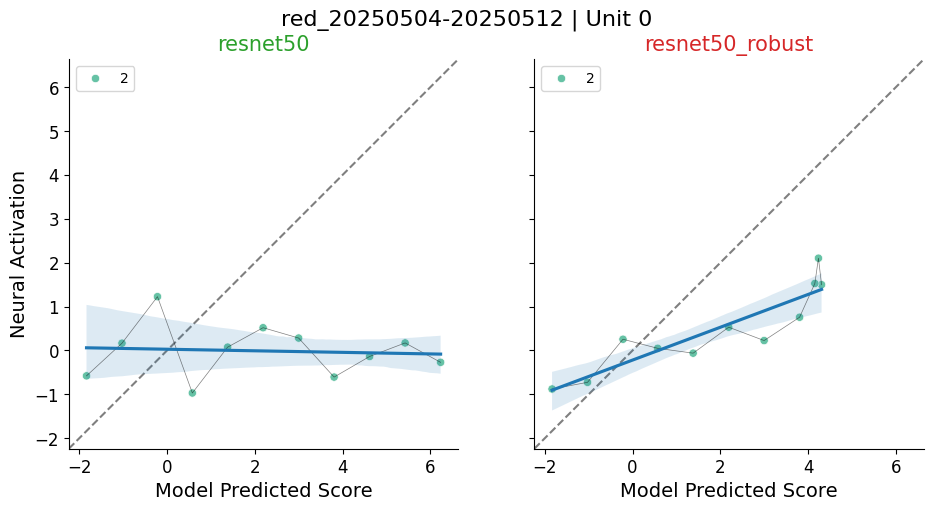

In [187]:
unit_id = 0
img_id = 2
selected_modelname = ["resnet50", "resnet50_robust"]
# unit_ids = df_accentuated.unit_id.unique()  # Based on the context showing these unit IDs
# for unit_id in unit_ids:
fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharex=True, sharey=True)
axes = axes.flatten()
for i, model_name in enumerate(selected_modelname):
    # for i, unit_id in enumerate(unit_ids):
    model_unit_df = df_accentuated.query("model_name == @model_name and unit_id == @unit_id and img_id == @img_id")
    sns.scatterplot(data=model_unit_df, 
                    x="score", y="neural_activation", hue="img_id", 
                    palette="Set2", ax=axes[i])
    # sns.lineplot(data=model_unit_df, x="score", y="neural_activation", 
    #              palette="Set2", ax=axes[i], color="black", alpha=0.5, lw=0.5)
    axes[i].set_title(f"{model_name}", fontsize=15, color=color_map[model_name], )
    axes[i].set_ylabel("Neural Activation", fontsize=14)
    axes[i].set_xlabel("Model Predicted Score", fontsize=14)
    axes[i].tick_params(axis='both', which='major', labelsize=12)
    axes[i].set_aspect(1.0)
    axes[i].axline((0, 0), slope=1, color='k', linestyle='--', alpha=0.5, zorder=0)
    axes[i].legend().remove()  # Remove individual legends to avoid clutter
    axes[i].set_xlim(lims)
    axes[i].set_ylim(lims)
    
plt.suptitle(f"{subject_id} | Unit {unit_id}", fontsize=16)
plt.tight_layout()
saveallforms(export_dir, f"{subject_id}_Unit{unit_id}_seed{img_id}_rn50_vs_rbst_model_control_cmp_scatter")

for i, model_name in enumerate(selected_modelname):
    model_unit_df = df_accentuated.query("model_name == @model_name and unit_id == @unit_id and img_id == @img_id")
    sns.lineplot(data=model_unit_df, x="score", y="neural_activation", 
                 palette="Set2", ax=axes[i], color="black", alpha=0.5, lw=0.5)
    axes[i].set_ylabel("Neural Activation", fontsize=14)
    axes[i].set_xlabel("Model Predicted Score", fontsize=14)
# plt.tight_layout()
saveallforms(export_dir, f"{subject_id}_Unit{unit_id}_seed{img_id}_rn50_vs_rbst_model_control_cmp_scatter_line")
    
for i, model_name in enumerate(selected_modelname):
    model_unit_df = df_accentuated.query("model_name == @model_name and unit_id == @unit_id and img_id == @img_id")
    sns.regplot(data=model_unit_df, x="score", y="neural_activation", 
                 ax=axes[i],  scatter=False, )
    axes[i].set_ylabel("Neural Activation", fontsize=14)
    axes[i].set_xlabel("Model Predicted Score", fontsize=14)
# plt.tight_layout()
saveallforms(export_dir, f"{subject_id}_Unit{unit_id}_seed{img_id}_rn50_vs_rbst_model_control_cmp_scatter_line_reg")

# plt.suptitle(f"{subject_id} | Unit {unit_id}", fontsize=16)
# saveallforms(export_dir, f"{subject_id}_Unit{unit_id}_seed{img_id}_rn50_vs_rbst_model_control_cmp")

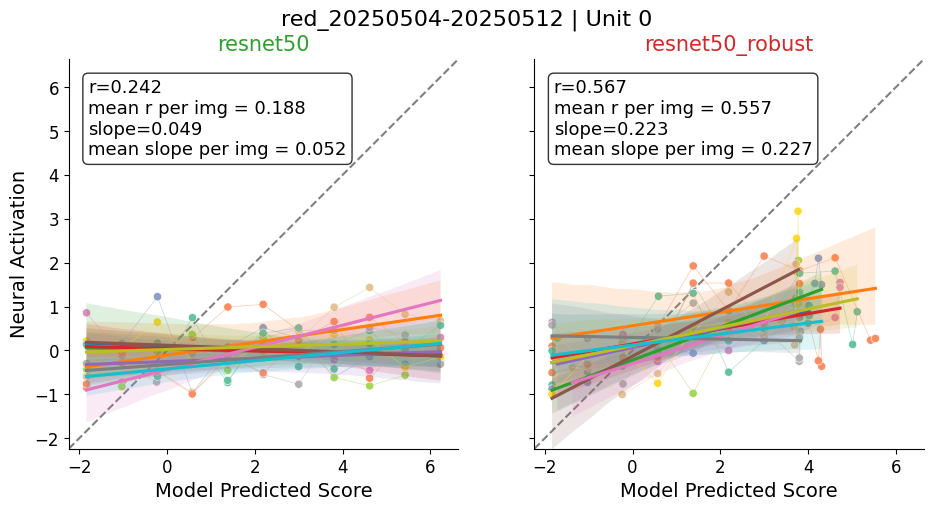

In [189]:
export_dir = "/Users/binxuwang/Github/Closed-loop-visual-insilico/export_dir/control_focus_cmp"
unit_ids = df_accentuated.unit_id.unique()  # Based on the context showing these unit IDs
unit_id = 0
selected_modelname = ["resnet50", "resnet50_robust"]
# unit_ids = df_accentuated.unit_id.unique()  # Based on the context showing these unit IDs
# for unit_id in unit_ids:
fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharex=True, sharey=True)
axes = axes.flatten()
for i, model_name in enumerate(selected_modelname):
    # for i, unit_id in enumerate(unit_ids):
    model_unit_df = df_accentuated.query("model_name == @model_name and unit_id == @unit_id")
    sns.scatterplot(data=model_unit_df, 
                    x="score", y="neural_activation", hue="img_id", 
                    palette="Set2", ax=axes[i])
    sns.lineplot(data=model_unit_df, 
                    x="score", y="neural_activation", hue="img_id", 
                    palette="Set2", ax=axes[i], color="black", alpha=0.5, lw=0.5)
    axes[i].set_title(f"{model_name}", fontsize=15, color=color_map[model_name])
    # axes[i].set_xlabel("Score", fontsize=12)
    axes[i].set_ylabel("Neural Activation", fontsize=14)
    axes[i].set_xlabel("Model Predicted Score", fontsize=14)
    axes[i].tick_params(axis='both', which='major', labelsize=12)
    axes[i].set_aspect(1.0)
    axes[i].axline((0, 0), slope=1, color='k', linestyle='--', alpha=0.5, zorder=0)
    axes[i].legend().remove()  # Remove individual legends to avoid clutter
    # for ax in axes:
    #     lims = [
    #         np.min([axes[i].get_xlim(), axes[i].get_ylim()]),  # min of both axes
    #         np.max([axes[i].get_xlim(), axes[i].get_ylim()]),  # max of both axes
    #     ]
    axes[i].set_xlim(lims)
    axes[i].set_ylim(lims)

plt.suptitle(f"{subject_id} | Unit {unit_id}", fontsize=16)
plt.tight_layout()
saveallforms(export_dir, f"{subject_id}_Unit{unit_id}_rn50_vs_rbst_model_control_cmp")

for i, model_name in enumerate(selected_modelname):
    model_unit_df = df_accentuated.query("model_name == @model_name and unit_id == @unit_id")
    for img_id in model_unit_df["img_id"].unique():
        model_unit_per_img_df = model_unit_df.query("img_id == @img_id")
        sns.regplot(data=model_unit_per_img_df, x="score", y="neural_activation", 
                    scatter=False, ax=axes[i], ci=95, )
    axes[i].set_ylabel("Neural Activation", fontsize=14)
    axes[i].set_xlabel("Model Predicted Score", fontsize=14)
saveallforms(export_dir, f"{subject_id}_Unit{unit_id}_rn50_vs_rbst_model_control_cmp_w_reg")

for i, model_name in enumerate(selected_modelname):
    model_unit_df = df_accentuated.query("model_name == @model_name and unit_id == @unit_id")
    corr_per_img = []
    slope_per_img = []
    for img_id in model_unit_df["img_id"].unique():
        model_unit_per_img_df = model_unit_df.query("img_id == @img_id")
        corr_per_img.append(model_unit_per_img_df["score"].corr(model_unit_per_img_df["neural_activation"]))
        fit_per_img = np.polyfit(model_unit_per_img_df["score"], model_unit_per_img_df["neural_activation"], 1)
        slope_per_img.append(fit_per_img[0])
    
    # Calculate correlation coefficient for this unit
    corr_r = model_unit_df["score"].corr(model_unit_df["neural_activation"])
    fit_all = np.polyfit(model_unit_df["score"], model_unit_df["neural_activation"], 1)
    slope_all = fit_all[0]
    corr_r_per_img_mean = np.mean(corr_per_img)
    slope_per_img_mean = np.mean(slope_per_img)
    
    axes[i].text(0.05, 0.95, f'r={corr_r:.3f}\nmean r per img = {corr_r_per_img_mean:.3f}\nslope={slope_all:.3f}\nmean slope per img = {slope_per_img_mean:.3f}', 
                transform=axes[i].transAxes, 
                verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),
                fontsize=13)
    
saveallforms(export_dir, f"{subject_id}_Unit{unit_id}_rn50_vs_rbst_model_control_cmp_w_stats")
plt.show()

In [135]:
sel_model_control_stats_df = control_stats_df.query("subject_id == @subject_id and model_name in @selected_modelname")
display(sel_model_control_stats_df)

,subject_id,unit_id,model_name,corr_r,corr_r_per_img_mean,corr_r_per_img_median,slope,slope_per_img_mean,slope_per_img_median,N,arch,robust
101,red_20250504-20250512,0,resnet50_robust,0.567229,0.557020,0.598026,0.223042,0.227467,0.204926,109,CNN,Robust
104,red_20250504-20250512,0,resnet50,0.242311,0.188062,0.174801,0.049130,0.051507,0.033495,109,CNN,None
111,red_20250504-20250512,15,resnet50_robust,0.523770,0.566944,0.595044,0.240016,0.240355,0.207896,110,CNN,Robust
114,red_20250504-20250512,15,resnet50,0.001300,0.004976,-0.057300,0.000345,-0.001627,-0.007859,110,CNN,None
121,red_20250504-20250512,19,resnet50_robust,0.368982,0.448571,0.583738,0.094492,0.095599,0.132410,108,CNN,Robust
124,red_20250504-20250512,19,resnet50,0.286033,0.367921,0.420064,0.072063,0.071617,0.068669,109,CNN,None
131,red_20250504-20250512,2,resnet50_robust,0.802336,0.838298,0.850380,0.547617,0.549610,0.531231,110,CNN,Robust
134,red_20250504-20250512,2,resnet50,0.583873,0.684815,0.721843,0.289403,0.289337,0.225065,110,CNN,None
141,red_20250504-20250512,9,resnet50_robust,0.579264,0.637952,0.718151,0.233659,0.238356,0.214449,110,CNN,Robust
144,red_20250504-20250512,9,resnet50,0.281139,0.268861,0.358155,0.063053,0.063007,0.060883,110,CNN,None


In [150]:
color_map = {"resnet50": "tab:green", "resnet50_robust": "tab:red"}
model_colors = [color_map.get(name, "gray") for name in selected_modelname]

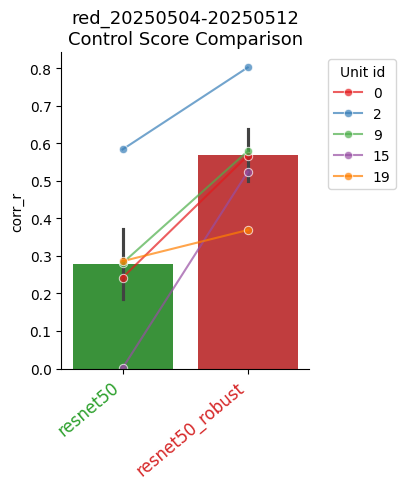

In [183]:
import seaborn as sns
import matplotlib.pyplot as plt
metric = "corr_r"
plt.figure(figsize=(4.2, 5))
sns.barplot(
    data=sel_model_control_stats_df,
    hue="model_name",
    x="model_name", y=metric,
    order=selected_modelname,
    palette=color_map,
    errorbar="se"
)
# sns.stripplot(
#     data=sel_model_control_stats_df,
#     x="model_name", y=metric, 
#     order=selected_modelname,
#     color="black", 
#     alpha=0.7,
#     jitter=0.2,
#     dodge=True
# )
sns.lineplot(
    data=sel_model_control_stats_df,
    x="model_name", y=metric, hue="unit_id",
    # order=selected_modelname,
    marker="o",
    palette="Set1",
    color="black",
    alpha=0.7,
)
ax = plt.gca()
for label, color in zip(ax.get_xticklabels(), model_colors):
    label.set_color(color)
    label.set_fontsize(12)

plt.xticks(rotation=40, ha="right")
plt.title(f"{subject_id}\nControl Score Comparison", fontsize=13) # ({subject_id})
plt.ylabel(f"{metric}")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10, title="Unit id")
plt.xlabel("")
plt.tight_layout()
saveallforms(export_dir, f"{subject_id}_control_score_by_model_rn50_vs_rbst_{metric}")
plt.show()


In [177]:
model_colors

['tab:green', 'tab:red']

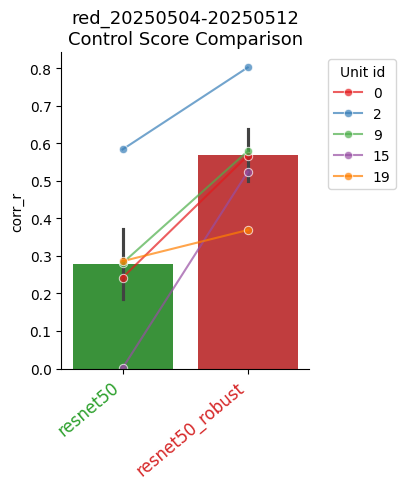

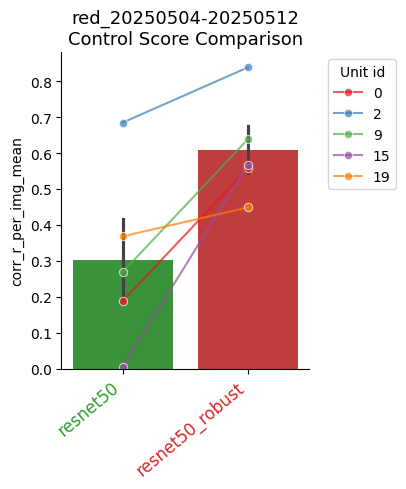

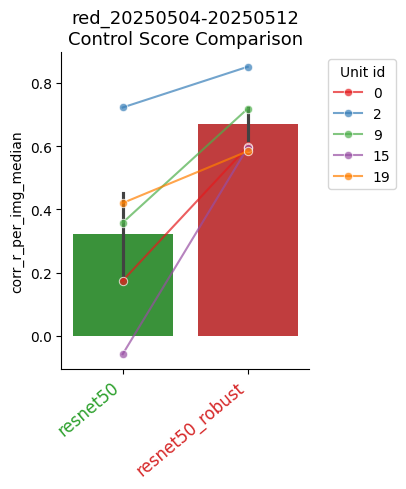

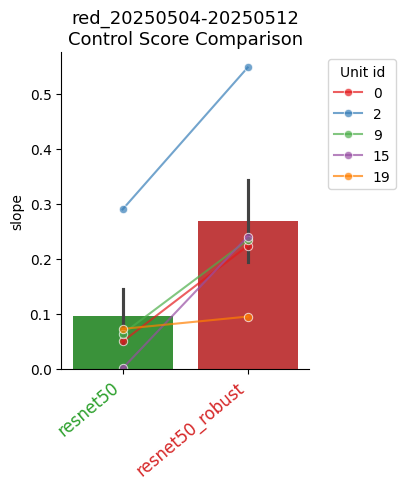

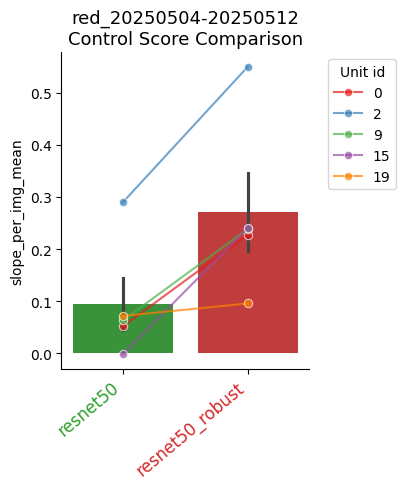

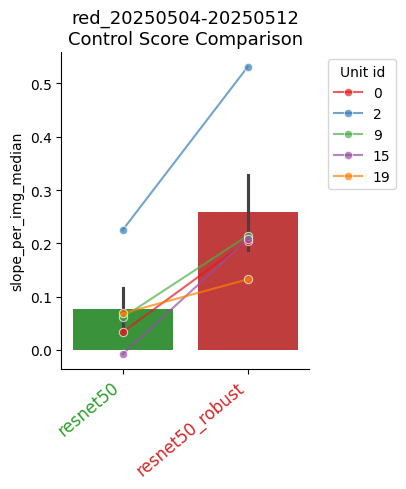

In [184]:
import seaborn as sns
import matplotlib.pyplot as plt
for metric in ["corr_r", "corr_r_per_img_mean", "corr_r_per_img_median",
               "slope", "slope_per_img_mean", "slope_per_img_median"]:
    # metric = "corr_r"
    plt.figure(figsize=(4.2, 5))
    sns.barplot(
        data=sel_model_control_stats_df,
        x="model_name", y=metric,hue="model_name",
        order=selected_modelname,
        palette=color_map,
        errorbar="se"
    )
    # sns.stripplot(
    #     data=sel_model_control_stats_df,
    #     x="model_name", y=metric, 
    #     order=selected_modelname,
    #     color="black", 
    #     alpha=0.7,
    #     jitter=0.2,
    #     dodge=True
    # )
    sns.lineplot(
        data=sel_model_control_stats_df,
        x="model_name", y=metric, hue="unit_id",
        # order=selected_modelname,
        marker="o",
        palette="Set1",
        color="black",
        alpha=0.7,
    )
    ax = plt.gca()
    for label, color in zip(ax.get_xticklabels(), model_colors):
        label.set_color(color)
        label.set_fontsize(12)

    plt.xticks(rotation=40, ha="right")
    plt.title(f"{subject_id}\nControl Score Comparison", fontsize=13) # ({subject_id})
    plt.ylabel(f"{metric}")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10, title="Unit id")
    plt.xlabel("")
    plt.tight_layout()
    saveallforms(export_dir, f"{subject_id}_control_score_by_model_rn50_vs_rbst_{metric}")
    plt.show()


## Stats synopsis 

In [71]:
stats_col = []
for subject_id in ['leap_250509-250512', 
                   'paul_20250505-20250512', 
                   'red_20250504-20250512', 
                   'three0_250508-250512', 
                   'venus_250507-250512']:
    df_accentuated = pd.read_pickle(join(tabdir, f"{subject_id}_202505_accentuated_df.pkl"))
    df_accentuated["score"] = df_accentuated["score"].astype(float)
    df_accentuated["neural_activation"] = df_accentuated["neural_activation"].astype(float)
    unit_ids = df_accentuated.unit_id.unique()  # Based on the context showing these unit IDs
    for unit_id in unit_ids:
        for i, model_name in enumerate(output_modelnames):
            model_unit_df = df_accentuated.query("model_name == @model_name and unit_id == @unit_id")
            corr_per_img = []
            slope_per_img = []
            for img_id in model_unit_df["img_id"].unique():
                model_unit_per_img_df = model_unit_df.query("img_id == @img_id")
                corr_per_img.append(model_unit_per_img_df["score"].corr(model_unit_per_img_df["neural_activation"]))
                fit_per_img = np.polyfit(model_unit_per_img_df["score"], model_unit_per_img_df["neural_activation"], 1)
                slope_per_img.append(fit_per_img[0])
                # sns.regplot(data=subset, x="score", y="neural_activation", 
                #             scatter=False, ax=axes[i])
            
            # Calculate correlation coefficient for this unit
            corr_r = model_unit_df["score"].corr(model_unit_df["neural_activation"])
            fit_all = np.polyfit(model_unit_df["score"], model_unit_df["neural_activation"], 1)
            slope_all = fit_all[0]
            # corr_r_per_img_mean = np.mean(corr_per_img)
            # slope_per_img_mean = np.mean(slope_per_img)
            stats_col.append({
                "subject_id": subject_id,
                "unit_id": unit_id,
                "model_name": model_name,
                "corr_r": corr_r,
                "corr_r_per_img_mean": np.mean(corr_per_img),
                "corr_r_per_img_median": np.median(corr_per_img),
                "slope": slope_all,
                "slope_per_img_mean": np.mean(slope_per_img),
                "slope_per_img_median": np.median(slope_per_img),
                "N": len(model_unit_df)
            })
control_stats_df = pd.DataFrame(stats_col)
control_stats_df.to_csv(join(tabdir, "control_stats_df_synopsis.csv"), index=False)
control_stats_df.to_pickle(join(tabdir, "control_stats_df_synopsis.pkl"))

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/var/folders/zc/krgdt7x11zvc_h0tv7k3mfdh0000gq/T/ipykernel_61884/48977155.py:19: RankWarning: Polyfit may be poorly conditioned
  fit_per_img = np.polyfit(model_unit_per_img_df["score"], model_unit_per_img_df["neural_activation"], 1)
/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/Users/binxuwang/mi

In [73]:
model_archmap = {'AlexNet_training_seed_01': "CNN",
                'resnet50_robust': "CNN",
                'resnet50_clip': "CNN",
                'resnet50_dino': "CNN",
                'resnet50': "CNN",
                'regnety_640': "CNN",
                'dinov2_vitb14_reg': "ViT",
                'clipag_vitb32': "ViT",
                'siglip2_vitb16': "ViT",
                'radio_v2.5-b': "ViT",}

In [74]:
model_robustmap = {'AlexNet_training_seed_01': "None",
                'resnet50_robust': "Robust",
                'resnet50_clip': "None",
                'resnet50_dino': "None",
                'resnet50': "None",
                'regnety_640': "None",
                'dinov2_vitb14_reg': "None",
                'clipag_vitb32': "Robust",
                'siglip2_vitb16': "None",
                'radio_v2.5-b': "None",}

In [75]:
control_stats_df["arch"] = control_stats_df["model_name"].map(model_archmap)
control_stats_df["robust"] = control_stats_df["model_name"].map(model_robustmap)

/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/binxuwang/miniforge3/envs/torch/lib/python3.11/site-packages/seaborn/_base.py:948: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key

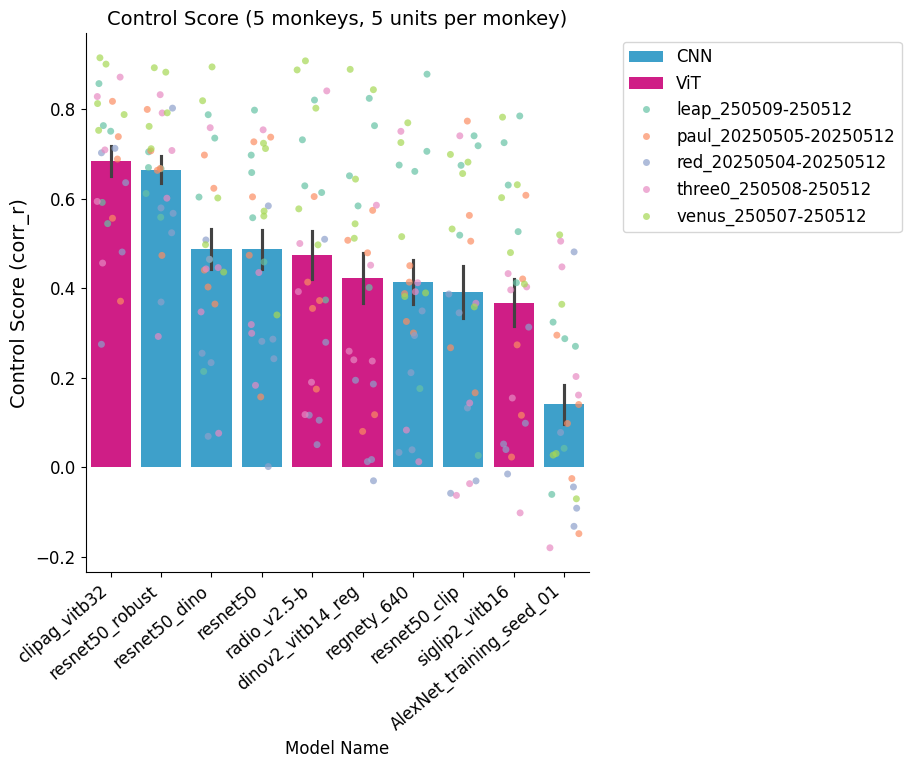

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the metric column to use for plotting
metric = "corr_r"  # Change this variable to select different metrics (e.g., "slope", "slope_per_img_mean")

plt.figure(figsize=(6.5, 7))
order = control_stats_df.groupby('model_name')[metric].mean().sort_values(ascending=False).index

# Bar = mean metric per model; scatter = all points (jittered by model)
sns.barplot(
    data=control_stats_df, 
    x="model_name", y=metric, order=order, 
    errorbar='se',
    hue="arch", palette={"ViT": "#EC008C", "CNN": "#27AAE1"}, #color='skyblue',
    edgecolor=None
)
sns.stripplot(
    data=control_stats_df, 
    x="model_name", y=metric, 
    hue="subject_id", palette="Set2", alpha=0.7, 
    order=order, 
    jitter=0.3,
)

plt.ylabel(f'Control Score ({metric})', fontsize=14)
plt.xlabel('Model Name', fontsize=12)
plt.title(f'Control Score (5 monkeys, 5 units per monkey)', fontsize=14)
plt.xticks(rotation=40, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
# plt.tight_layout()
plt.show()

In [81]:
import matplotlib.pyplot as plt
import seaborn as sns
syn_figdir = "/Users/binxuwang/Github/Closed-loop-visual-insilico/export_dir/control_stats_synopsis"



In [86]:
import warnings
warnings.filterwarnings(
    "ignore",
    message="When grouping with a length-1 list-like",
    category=FutureWarning,
)

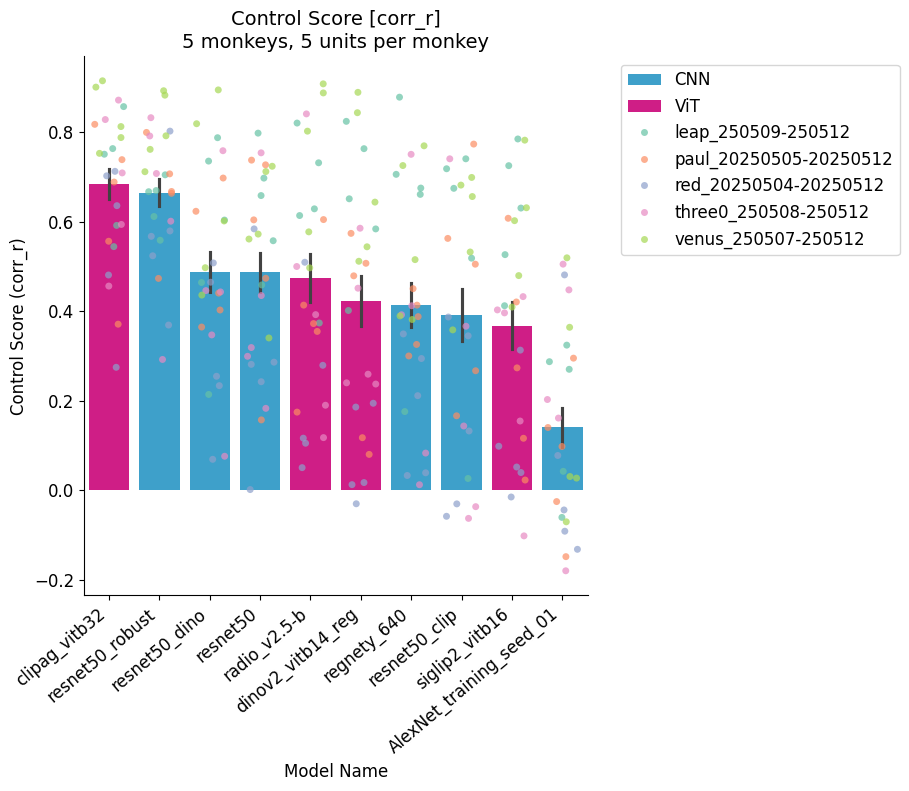

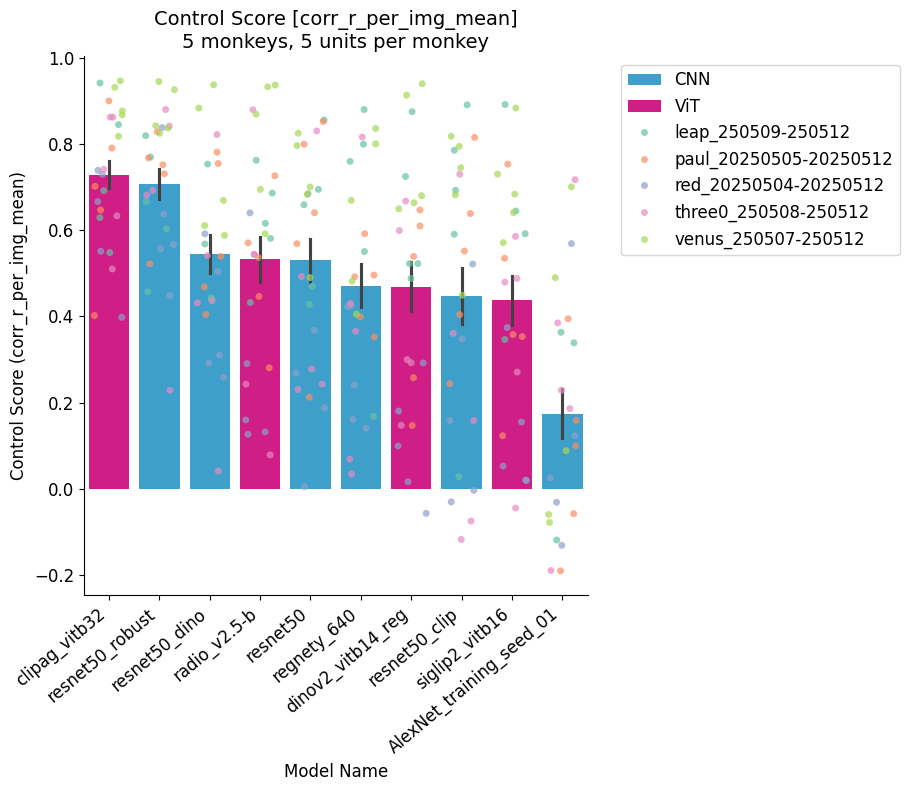

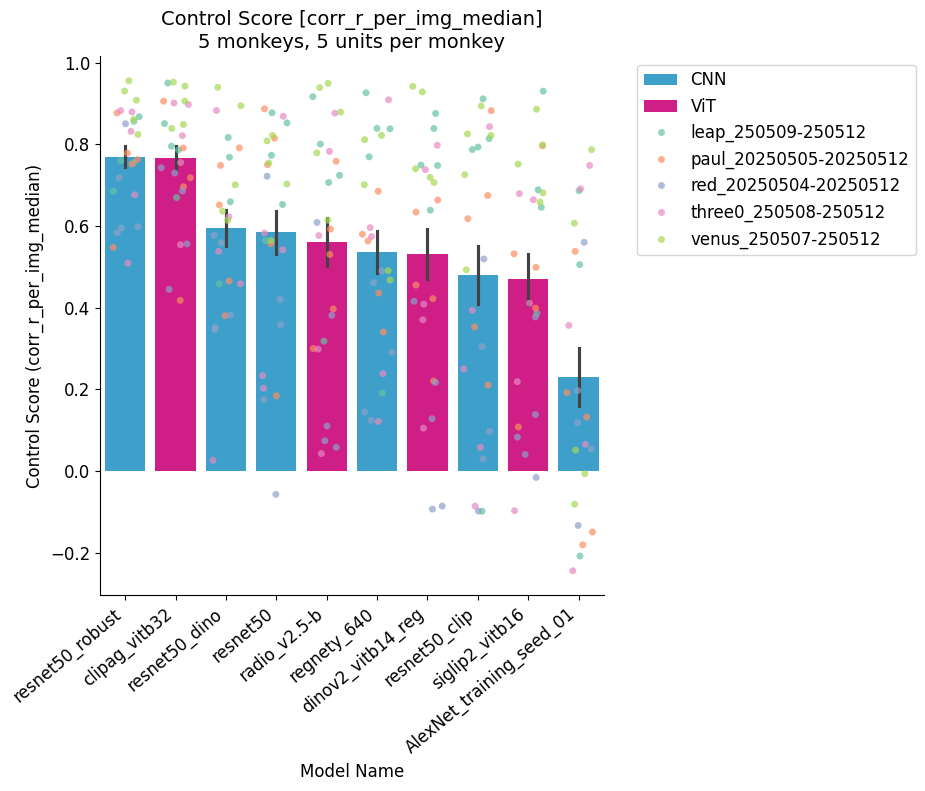

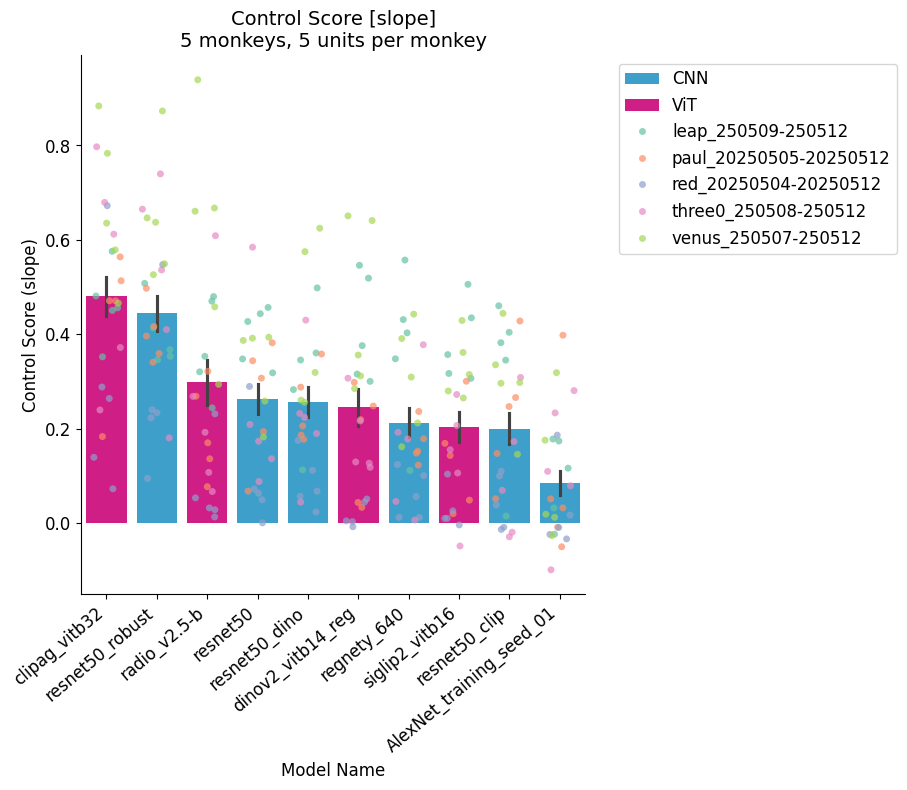

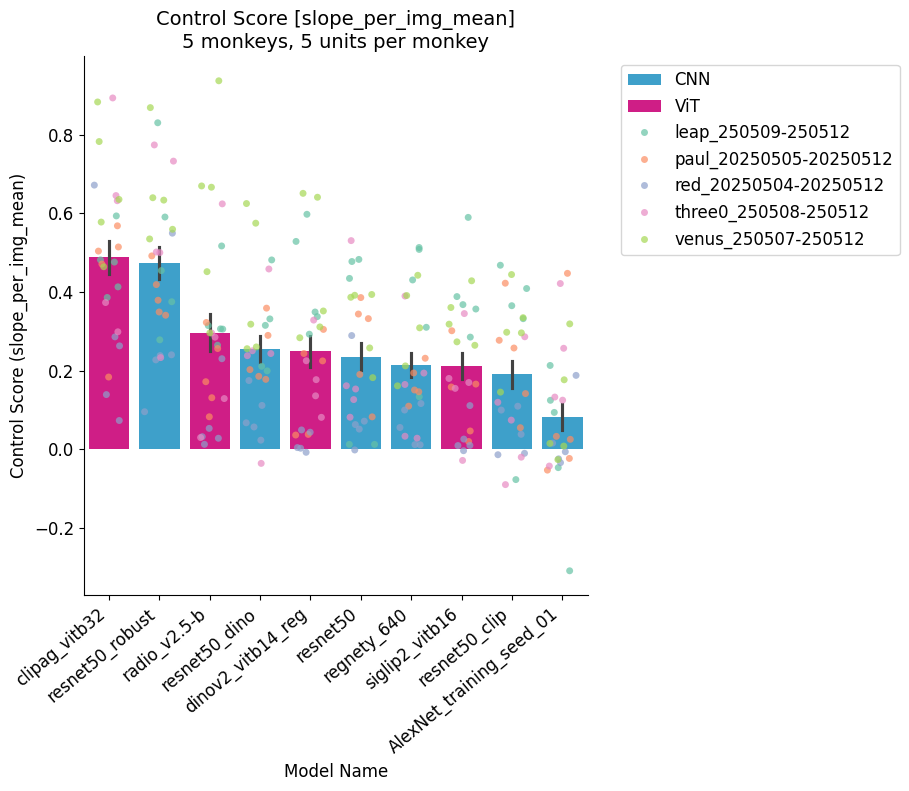

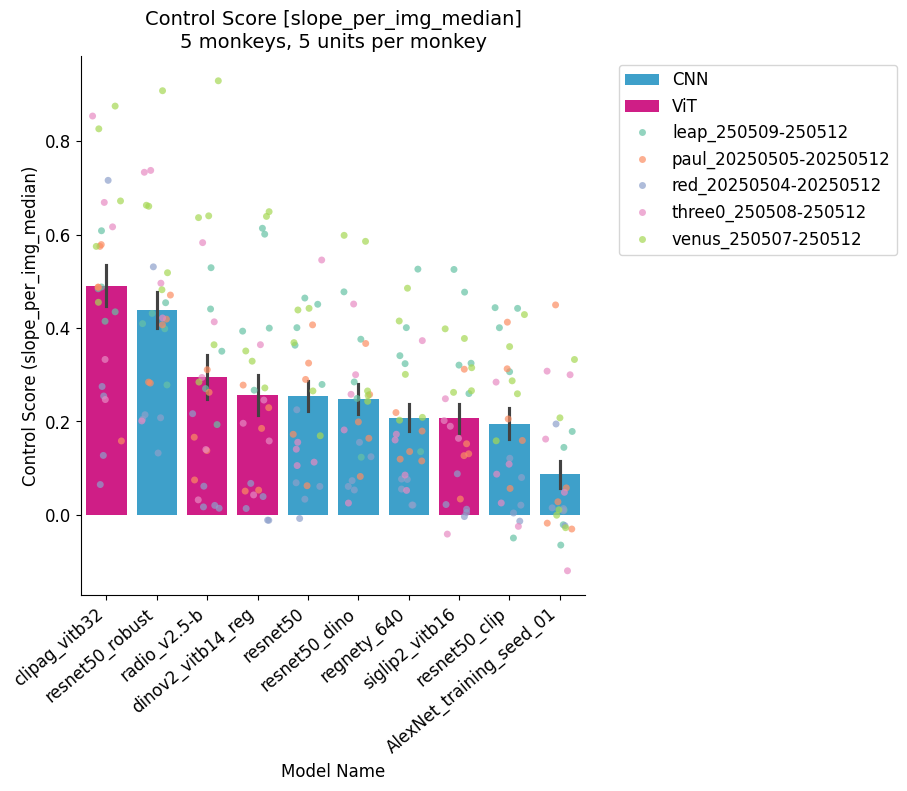

In [87]:
# Set the metric column to use for plotting
# metric = "corr_r"  # Change this variable to select different metrics (e.g., "slope", "slope_per_img_mean")

for metric in ["corr_r", "corr_r_per_img_mean", "corr_r_per_img_median",
               "slope", "slope_per_img_mean", "slope_per_img_median"]:
    plt.figure(figsize=(6.5, 7))
    order = control_stats_df.groupby('model_name')[metric].mean().sort_values(ascending=False).index
    # Bar = mean metric per model; scatter = all points (jittered by model)
    sns.barplot(
        data=control_stats_df, 
        x="model_name", y=metric, order=order, 
        errorbar='se',
        hue="arch", palette={"ViT": "#EC008C", "CNN": "#27AAE1"}, #color='skyblue',
        edgecolor=None
    )
    sns.stripplot(
        data=control_stats_df, 
        x="model_name", y=metric, 
        hue="subject_id", palette="Set2", alpha=0.7, 
        order=order, 
        jitter=0.3,
    )
    plt.ylabel(f'Control Score ({metric})', fontsize=12)
    plt.xlabel('Model Name', fontsize=12)
    plt.title(f'Control Score [{metric}]\n5 monkeys, 5 units per monkey', fontsize=14)
    plt.xticks(rotation=40, ha='right', fontsize=12)
    plt.yticks(fontsize=12)
    # plt.tight_layout()
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
    saveallforms(syn_figdir, f"control_score_by_model_arch_{metric}")
    plt.show()

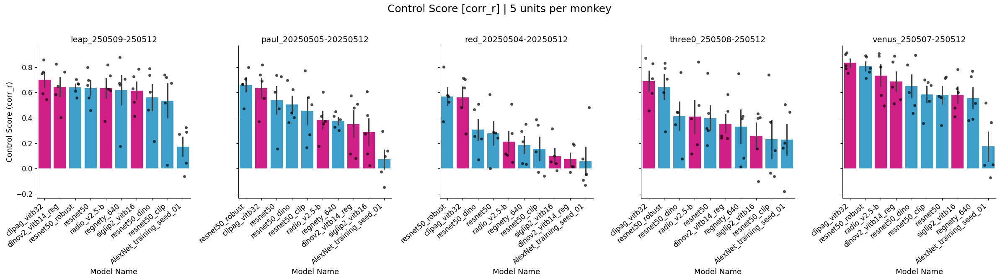

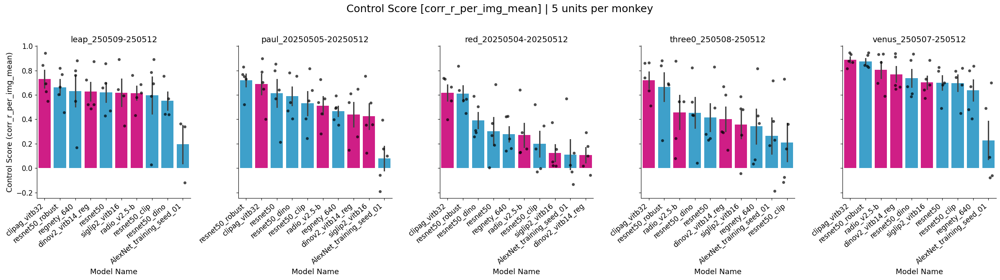

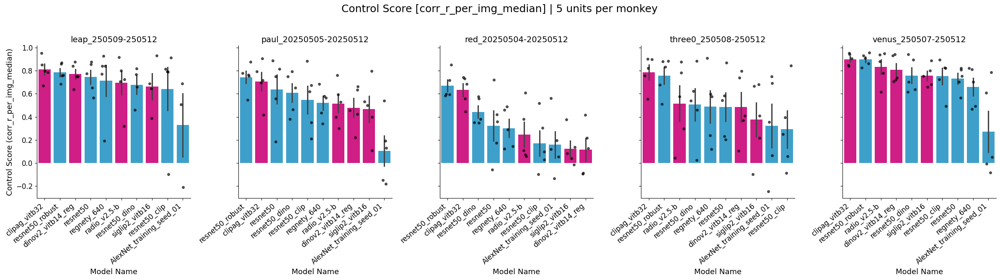

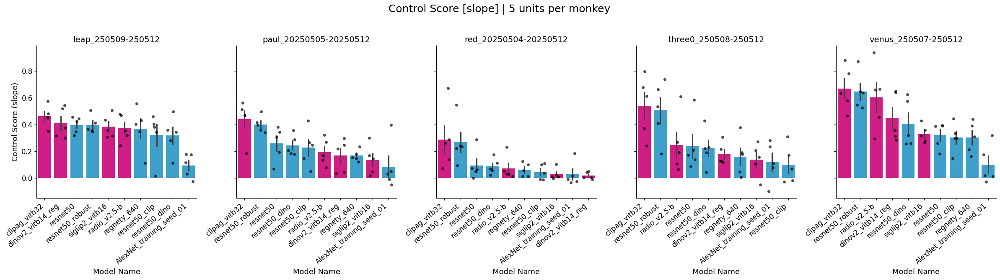

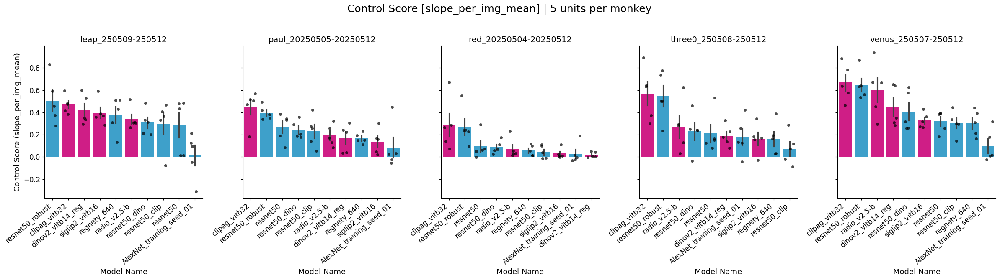

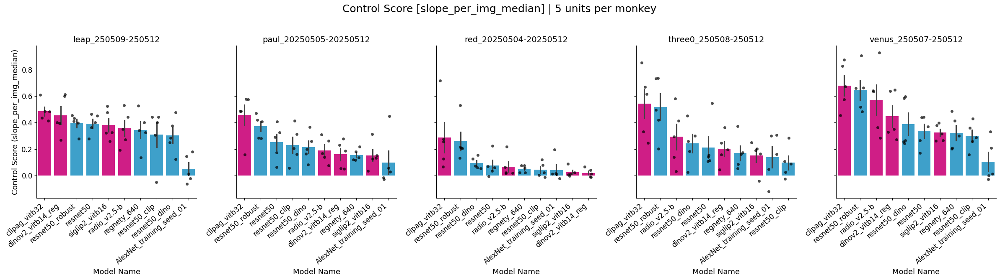

In [91]:
# Set the metric column to use for plotting
metric = "corr_r"  # Change this variable to select different metrics (e.g., "slope", "slope_per_img_mean")
for metric in ["corr_r", "corr_r_per_img_mean", "corr_r_per_img_median",
            "slope", "slope_per_img_mean", "slope_per_img_median"]:
    fig, axes = plt.subplots(1, 5, figsize=(24, 7), sharey=True)
    subj_names = ['leap_250509-250512', 
                 'paul_20250505-20250512', 
                 'red_20250504-20250512', 
                 'three0_250508-250512', 
                 'venus_250507-250512']
    for i, subject_id in enumerate(subj_names):
        subj_df = control_stats_df.query("subject_id == @subject_id")
        order = subj_df.groupby('model_name')[metric].mean().sort_values(ascending=False).index
        ax = axes[i]
        plt.sca(ax)
        sns.barplot(
            data=subj_df, 
            x="model_name", y=metric, order=order, 
            errorbar='se',
            hue="arch", palette={"ViT": "#EC008C", "CNN": "#27AAE1"},
            edgecolor=None,
            ax=ax,
        )
        sns.stripplot(
            data=subj_df, 
            x="model_name", y=metric, color="black",
            alpha=0.7, #hue="subject_id", palette="Set2", 
            order=order, 
            jitter=0.3,
            ax=ax,
        )

        ax.set_ylabel(f'Control Score ({metric})', fontsize=13) if i == 0 else ax.set_ylabel("")
        ax.set_xlabel('Model Name', fontsize=13)
        ax.set_title(f"{subject_id}", fontsize=14)
        ax.tick_params(axis='x', rotation=40, labelsize=12)
        ax.tick_params(axis='y', labelsize=12)
        plt.xticks(rotation=40, ha='right', fontsize=12)
        plt.yticks(fontsize=12)
        # Remove duplicate legends
        if i > 0:
            ax.get_legend().remove()
        else:
            handles, labels = ax.get_legend_handles_labels()
            if len(handles) > 0:
                ax.legend().remove()  # Remove first legend to prevent overplotting

    fig.suptitle(f'Control Score [{metric}] | 5 units per monkey', fontsize=18)
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    saveallforms(syn_figdir, f"control_score_by_model_arch_{metric}_per_subj_panel")
    plt.show()

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the metric column to use for plotting
metric = "corr_r"  # Change this variable to select different metrics (e.g., "slope", "slope_per_img_mean")

for subject_id in ['leap_250509-250512', 
                   'paul_20250505-20250512', 
                   'red_20250504-20250512', 
                   'three0_250508-250512', 
                   'venus_250507-250512']:
    subj_df = control_stats_df.query("subject_id == @subject_id")
    for metric in ["corr_r", "corr_r_per_img_mean", "corr_r_per_img_median",
               "slope", "slope_per_img_mean", "slope_per_img_median"]:
        plt.figure(figsize=(6.5, 7))
        order = subj_df.groupby('model_name')[metric].mean().sort_values(ascending=False).index
        # Bar = mean metric per model; scatter = all points (jittered by model)
        sns.barplot(
            data=subj_df, 
            x="model_name", y=metric, order=order, 
            errorbar='se',
            hue="arch", palette={"ViT": "#EC008C", "CNN": "#27AAE1"}, #color='skyblue',
            edgecolor=None
        )
        sns.stripplot(
            data=subj_df, 
            x="model_name", y=metric, 
            hue="subject_id", palette="Set2", alpha=0.7, 
            order=order, 
            jitter=0.3,
        )

        plt.ylabel(f'Control Score ({metric})', fontsize=12)
        plt.xlabel('Model Name', fontsize=12)
        plt.title(f'Control Score [{metric}]\n{subject_id}, 5 units per monkey', fontsize=14)
        plt.xticks(rotation=40, ha='right', fontsize=12)
        plt.yticks(fontsize=12)
        plt.tight_layout()
        saveallforms(syn_figdir, f"control_score_by_model_arch_{metric}_{subject_id}")
        plt.show()

In [11]:
subset = model_unit_df.query("img_id == @img_id")

In [12]:
subset

,model_name,unit_id,img_id,level,score,filepath,neural_activation
1771,radio_v2.5-b,0,9,-0.228237,-0.218468,radio_v2.5-b_RidgeCV_unit_0_img_9_level_-0.228...,1.003389
1772,radio_v2.5-b,0,9,-1.037346,-1.028214,radio_v2.5-b_RidgeCV_unit_0_img_9_level_-1.037...,-0.265150
1773,radio_v2.5-b,0,9,-1.846455,-1.836511,radio_v2.5-b_RidgeCV_unit_0_img_9_level_-1.846...,0.430453
1774,radio_v2.5-b,0,9,0.580873,0.572466,radio_v2.5-b_RidgeCV_unit_0_img_9_level_0.5808...,0.499185
1775,radio_v2.5-b,0,9,1.389982,1.385934,radio_v2.5-b_RidgeCV_unit_0_img_9_level_1.3899...,0.716346
1776,radio_v2.5-b,0,9,2.199091,2.189371,radio_v2.5-b_RidgeCV_unit_0_img_9_level_2.1990...,3.202703
1777,radio_v2.5-b,0,9,3.0082,2.998317,radio_v2.5-b_RidgeCV_unit_0_img_9_level_3.0081...,-0.371586
1778,radio_v2.5-b,0,9,3.817309,3.811064,radio_v2.5-b_RidgeCV_unit_0_img_9_level_3.8173...,0.566698
1779,radio_v2.5-b,0,9,4.626418,4.618773,radio_v2.5-b_RidgeCV_unit_0_img_9_level_4.6264...,1.061807
1780,radio_v2.5-b,0,9,5.435527,5.430635,radio_v2.5-b_RidgeCV_unit_0_img_9_level_5.4355...,-0.082519


In [ ]:
dataroot = r"/n/holylabs/LABS/alvarez_lab/Lab/VVS_Accentuation/Ephys_Data"
data_path = join(dataroot, 'vvs-accentuate_controlsessions_5monkeys_250504-250512.h5')
data = load_from_hdf5(data_path)